# Training Analysis: PPO vs MaskablePPO

- Анализ среды и observation
- Baseline (random policy)
- PPO без маски (mode collapse)
- MaskablePPO с machine states (DEPLOY → REPAIR)
- Сравнение всех трёх

In [11]:
from setup import setup_modules
setup_modules()

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

from stable_baselines3 import PPO
from stable_baselines3.common.callbacks import BaseCallback
from stable_baselines3.common.vec_env import DummyVecEnv
from sb3_contrib import MaskablePPO
from sb3_contrib.common.wrappers import ActionMasker

from envs import BuildingIncidentEnv, AgentActionType
from envs.training import make_env, make_masked_env
from incident_simulator import IncidentType

sns.set_style('darkgrid')
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 10

ACTION_NAMES = [a.name for a in AgentActionType]

ENV_CONFIG = dict(
    house_type='16',
    max_steps=150,
    incident_probability=0.05,
    resource_budget=100.0,
    resource_regen_rate=0.5,
    enable_spread=True,
    max_active_incidents=10,
    max_teams=3,
)
print('Imports OK')

Imports OK


## 1. Среда: observation и action space

In [13]:
env = BuildingIncidentEnv(**ENV_CONFIG)
obs, _ = env.reset(seed=42)

print('=== Observation Space ===')
print(f'Shape: {env.observation_space.shape}  ({env.observation_space.shape[0]:,} features)')
obs_zero_pct = (obs == 0).mean() * 100
print(f'Нули: {obs_zero_pct:.1f}%')

print('\n=== Action Space (MultiDiscrete) ===')
print(f'nvec: {env.action_space.nvec}  → [action_type, target_idx, target_type]')
print()
for a in AgentActionType:
    print(f'  [{a.value}] {a.name:<20} cost={a.cost:+.1f}  effectiveness={a.effectiveness:.1f}')

print('\n=== Action masks (0 команд на поле) ===')
mask = env.action_masks()
print(f'Mask shape: {mask.shape}  (7 action_type + {env._max_targets} targets + 2 type)')
for i, a in enumerate(AgentActionType):
    status = 'РАЗРЕШЕНО  ' if mask[i] else 'ЗАБЛОКИРОВАНО'
    print(f'  {a.name:<20}: {status}')

2026-05-14 14:10:27.133 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:10:27.133 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:10:27.152 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:10:27.152 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05


=== Observation Space ===
Shape: (20422,)  (20,422 features)
Нули: 69.2%

=== Action Space (MultiDiscrete) ===
nvec: [   7 1372    2]  → [action_type, target_idx, target_type]

  [0] REPAIR               cost=+2.5  effectiveness=0.8
  [1] DEPLOY_TEAM          cost=+0.6  effectiveness=0.0
  [2] WITHDRAW_TEAM        cost=+0.0  effectiveness=0.0
  [3] SHUT_OFF_WATER       cost=+0.4  effectiveness=0.7
  [4] INSPECT              cost=+0.2  effectiveness=0.0
  [5] MONITOR              cost=+0.0  effectiveness=0.0
  [6] CALL_BACKUP          cost=+5.0  effectiveness=0.8

=== Action masks (0 команд на поле) ===
Mask shape: (1381,)  (7 action_type + 1372 targets + 2 type)
  REPAIR              : ЗАБЛОКИРОВАНО
  DEPLOY_TEAM         : РАЗРЕШЕНО  
  WITHDRAW_TEAM       : ЗАБЛОКИРОВАНО
  SHUT_OFF_WATER      : РАЗРЕШЕНО  
  INSPECT             : РАЗРЕШЕНО  
  MONITOR             : РАЗРЕШЕНО  
  CALL_BACKUP         : РАЗРЕШЕНО  


## 2. Машина состояний: демонстрация

In [14]:
demo_env = BuildingIncidentEnv(**ENV_CONFIG)
demo_env.reset(seed=0)
demo_env.simulator.create_incident(IncidentType.GVS_RISER_FAILURE, demo_env.house.nodes[0], severity=0.8)

REPAIR   = np.array([0, 0, 0])
DEPLOY   = np.array([1, 0, 0])
WITHDRAW = np.array([2, 0, 0])

rows = []
for action, label in [
    (REPAIR,   'REPAIR без DEPLOY'),
    (DEPLOY,   'DEPLOY_TEAM'),
    (REPAIR,   'REPAIR после DEPLOY'),
    (DEPLOY,   'DEPLOY повторно'),
    (WITHDRAW, 'WITHDRAW_TEAM'),
    (WITHDRAW, 'WITHDRAW без команды'),
]:
    mask_before = demo_env.action_masks()[:len(AgentActionType)]
    obs, r, *_, info = demo_env.step(action)
    rows.append({
        'Действие': label,
        'reward': round(r, 2),
        'active_teams': info['active_teams'],
        'mask_REPAIR': mask_before[AgentActionType.REPAIR.value],
        'mask_DEPLOY': mask_before[AgentActionType.DEPLOY_TEAM.value],
        'mask_WITHDRAW': mask_before[AgentActionType.WITHDRAW_TEAM.value],
    })

pd.set_option('display.max_colwidth', 40)
pd.DataFrame(rows)

2026-05-14 14:10:29.038 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:10:29.039 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:10:29.065 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:10:29.066 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:10:29.084 | INFO     | house_graph.states.incident_state:set_incident:20 - Set incident: gvs_riser_failure started with severity 0.80 (Total incidents in house 5553559296: 1)
2026-05-14 14:10:29.084 | DEBUG    | incident_simulator.incident_simulator:_create_incident:201 - New incident: gvs_riser_failure at node 6282847168, severity=0.80
2026-05-14 14:10:29.084 | DEBUG    | envs.reward:_repair_action:184 - REPAIR failed: no team deployed at target
2

,Действие,reward,active_teams,mask_REPAIR,mask_DEPLOY,mask_WITHDRAW
0,REPAIR без DEPLOY,-6.26,0,False,True,False
1,DEPLOY_TEAM,-2.64,1,False,True,False
2,REPAIR после DEPLOY,-0.22,1,True,True,True
3,DEPLOY повторно,-5.28,1,True,True,True
4,WITHDRAW_TEAM,-4.14,0,True,True,True
5,WITHDRAW без команды,-5.01,0,False,True,False


## 3. Вспомогательные функции

In [15]:
def collect_rollouts(env, policy_fn, n_episodes=30, seed=0):
    records, ep_records = [], []
    for ep in range(n_episodes):
        obs, _ = env.reset(seed=seed + ep)
        done, ep_reward, ep_steps = False, 0, 0
        ep_resources, ep_incidents = [], []
        while not done:
            action = policy_fn(obs, env)
            obs, reward, term, trunc, info = env.step(action)
            done = term or trunc
            action_name = list(AgentActionType)[int(action[0])].name
            records.append({
                'episode': ep, 'step': ep_steps,
                'action_idx': int(action[0]), 'action_name': action_name,
                'reward': reward, 'resources': info['resources'],
                'active_incidents': info['active_incidents'],
                'active_teams': info.get('active_teams', 0),
                'terminated': term,
            })
            ep_reward += reward
            ep_steps += 1
            ep_resources.append(info['resources'])
            ep_incidents.append(info['active_incidents'])
        ep_records.append({
            'episode': ep, 'total_reward': ep_reward, 'steps': ep_steps,
            'terminated_early': term,
            'mean_resources': np.mean(ep_resources),
            'max_incidents': max(ep_incidents) if ep_incidents else 0,
        })
    return pd.DataFrame(records), pd.DataFrame(ep_records)


def smooth(values, w=20):
    return pd.Series(values).rolling(w, min_periods=1).mean().values


def repair_without_team(df):
    return ((df['action_name'] == 'REPAIR') & (df['active_teams'] == 0)).sum()


print('Функции определены')

Функции определены


## 4. Baseline: случайная политика

In [16]:
rand_env = BuildingIncidentEnv(**ENV_CONFIG)
random_policy = lambda obs, env: env.action_space.sample()

print('Сбор случайной политики...')
df_rand, df_rand_ep = collect_rollouts(rand_env, random_policy, n_episodes=30, seed=0)
print(f'Mean reward: {df_rand_ep["total_reward"].mean():.2f} ± {df_rand_ep["total_reward"].std():.2f}')
print(f'Ранних остановок: {df_rand_ep["terminated_early"].sum()}/{len(df_rand_ep)}')
print(f'REPAIR без команды: {repair_without_team(df_rand)}')
print()
print(df_rand['action_name'].value_counts().reindex(ACTION_NAMES, fill_value=0).to_string())

2026-05-14 14:10:35.812 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:10:35.813 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:10:35.839 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:10:35.839 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:10:35.876 | DEBUG    | envs.reward:_repair_action:184 - REPAIR failed: no team deployed at target
2026-05-14 14:10:35.908 | DEBUG    | envs.reward:_withdraw_team_action:162 - WITHDRAW failed: no team at target
2026-05-14 14:10:35.916 | DEBUG    | envs.reward:_repair_action:184 - REPAIR failed: no team deployed at target
2026-05-14 14:10:35.962 | DEBUG    | envs.reward:_repair_action:184 - REPAIR failed: no team deployed at target


Сбор случайной политики...


2026-05-14 14:10:36.045 | DEBUG    | envs.reward:_withdraw_team_action:162 - WITHDRAW failed: no team at target
2026-05-14 14:10:36.069 | DEBUG    | envs.reward:_deploy_team_action:137 - DEPLOY failed: no team slots
2026-05-14 14:10:36.162 | DEBUG    | envs.reward:_deploy_team_action:137 - DEPLOY failed: no team slots
2026-05-14 14:10:36.170 | DEBUG    | envs.reward:_repair_action:184 - REPAIR failed: no team deployed at target
2026-05-14 14:10:36.178 | DEBUG    | envs.reward:_withdraw_team_action:162 - WITHDRAW failed: no team at target
2026-05-14 14:10:36.201 | DEBUG    | envs.reward:_deploy_team_action:137 - DEPLOY failed: no team slots
2026-05-14 14:10:36.216 | DEBUG    | envs.reward:_deploy_team_action:137 - DEPLOY failed: no team slots
2026-05-14 14:10:36.224 | DEBUG    | envs.reward:_deploy_team_action:137 - DEPLOY failed: no team slots
2026-05-14 14:10:36.232 | DEBUG    | envs.reward:_deploy_team_action:137 - DEPLOY failed: no team slots
2026-05-14 14:10:36.256 | DEBUG    | env

Mean reward: 143.75 ± 35.46
Ранних остановок: 0/30
REPAIR без команды: 37

action_name
REPAIR            626
DEPLOY_TEAM       594
WITHDRAW_TEAM     620
SHUT_OFF_WATER    679
INSPECT           662
MONITOR           666
CALL_BACKUP       653


## 5. Обучение PPO (без маскировки)

In [17]:
class TrainingTracker(BaseCallback):
    def __init__(self):
        super().__init__()
        self.episode_rewards = []
        self.episode_lengths = []
        self.action_log = []
        self.ts_log, self.mean_r_log = [], []

    def _on_step(self):
        for a in self.locals.get('actions', []):
            self.action_log.append(int(a[0]))
        for done, info in zip(self.locals.get('dones', []), self.locals.get('infos', [])):
            if done and 'episode' in info:
                self.episode_rewards.append(info['episode']['r'])
                self.episode_lengths.append(info['episode']['l'])
        if self.num_timesteps % 5000 == 0 and self.episode_rewards:
            self.ts_log.append(self.num_timesteps)
            self.mean_r_log.append(np.mean(self.episode_rewards[-20:]))
        return True


TOTAL_TIMESTEPS = 100_000
N_ENVS = 4

ppo_envs = DummyVecEnv([make_env(ENV_CONFIG, i, seed=42) for i in range(N_ENVS)])
ppo_tracker = TrainingTracker()

ppo_model = PPO(
    'MlpPolicy', ppo_envs, verbose=0,
    learning_rate=3e-4, n_steps=512, batch_size=128, n_epochs=10,
    gamma=0.99, gae_lambda=0.95, clip_range=0.2, ent_coef=0.01,
    policy_kwargs=dict(net_arch=[256, 256]), seed=42,
)
print(f'Параметров: {sum(p.numel() for p in ppo_model.policy.parameters()):,}')
ppo_model.learn(total_timesteps=TOTAL_TIMESTEPS, callback=ppo_tracker, progress_bar=True)
ppo_model.save('../models/ppo_no_mask')
print(f'PPO готов. Финальная средняя награда: {np.mean(ppo_tracker.episode_rewards[-20:]):.2f}')

2026-05-14 14:12:15.562 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:12:15.563 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:12:15.589 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:12:15.590 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:12:15.609 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:12:15.610 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:12:15.627 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:12:15.627 | INFO     | incident_simulat

Параметров: 10,943,334


2026-05-14 14:12:16.116 | DEBUG    | envs.reward:_withdraw_team_action:162 - WITHDRAW failed: no team at target
2026-05-14 14:12:16.125 | DEBUG    | envs.reward:_withdraw_team_action:162 - WITHDRAW failed: no team at target
2026-05-14 14:12:16.125 | INFO     | house_graph.states.incident_state:update_incident:28 - Update incident: hvs_pipe_failure: severity 0.16 (Total incidents in house 14445646368: 3)
2026-05-14 14:12:16.125 | INFO     | house_graph.states.incident_state:update_incident:28 - Update incident: hvs_pipe_failure: severity 0.03 (Total incidents in house 14445646368: 3)
2026-05-14 14:12:16.125 | INFO     | house_graph.states.incident_state:update_incident:28 - Update incident: hvs_pipe_failure: severity 0.03 (Total incidents in house 14445646368: 3)
2026-05-14 14:12:16.144 | DEBUG    | envs.reward:_repair_action:184 - REPAIR failed: no team deployed at target
2026-05-14 14:12:16.155 | DEBUG    | envs.reward:_withdraw_team_action:162 - WITHDRAW failed: no team at target
202

PPO готов. Финальная средняя награда: nan


## 6. Обучение MaskablePPO (DEPLOY → REPAIR)

In [18]:
masked_envs = DummyVecEnv([make_masked_env(ENV_CONFIG, i, seed=42) for i in range(N_ENVS)])
masked_tracker = TrainingTracker()

masked_model = MaskablePPO(
    'MlpPolicy', masked_envs, verbose=0,
    learning_rate=3e-4, n_steps=512, batch_size=128, n_epochs=10,
    gamma=0.99, gae_lambda=0.95, clip_range=0.2, ent_coef=0.01,
    policy_kwargs=dict(net_arch=[256, 256]), seed=42,
)
masked_model.learn(total_timesteps=TOTAL_TIMESTEPS, callback=masked_tracker, progress_bar=True)
masked_model.save('../models/masked_ppo')
print(f'MaskablePPO готов. Финальная средняя награда: {np.mean(masked_tracker.episode_rewards[-20:]):.2f}')

2026-05-14 14:45:38.981 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:45:38.981 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:45:39.007 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:45:39.007 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:45:39.032 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:45:39.032 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-14 14:45:39.056 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-14 14:45:39.056 | INFO     | incident_simulat

MaskablePPO готов. Финальная средняя награда: nan


## 7. Кривые обучения

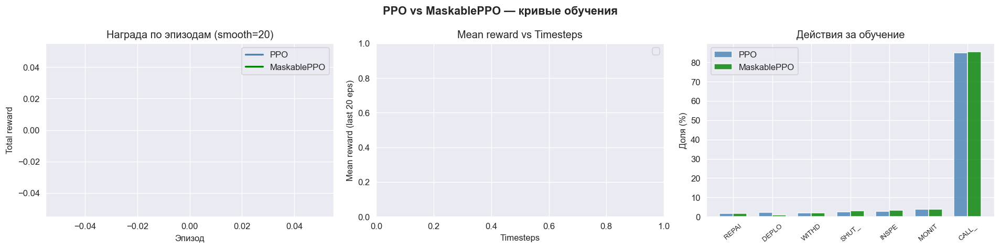

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Кривые наград по эпизодам
ax = axes[0]
for tracker, label, color in [
    (ppo_tracker,    'PPO',         'steelblue'),
    (masked_tracker, 'MaskablePPO', 'green'),
]:
    r = tracker.episode_rewards
    ax.plot(r, alpha=0.15, color=color, linewidth=0.5)
    ax.plot(smooth(r), color=color, linewidth=2, label=label)
ax.set_title('Награда по эпизодам (smooth=20)')
ax.set_xlabel('Эпизод')
ax.set_ylabel('Total reward')
ax.legend()

# Средняя награда vs timesteps
ax = axes[1]
for tracker, label, color in [
    (ppo_tracker,    'PPO',         'steelblue'),
    (masked_tracker, 'MaskablePPO', 'green'),
]:
    if tracker.ts_log:
        ax.plot(tracker.ts_log, tracker.mean_r_log, 'o-', color=color, ms=3, label=label)
ax.set_title('Mean reward vs Timesteps')
ax.set_xlabel('Timesteps')
ax.set_ylabel('Mean reward (last 20 eps)')
ax.legend()

# Действия за всё обучение
ax = axes[2]
w = 0.35
x = np.arange(len(ACTION_NAMES))
for i, (tracker, label, color) in enumerate([
    (ppo_tracker,    'PPO',         'steelblue'),
    (masked_tracker, 'MaskablePPO', 'green'),
]):
    counts = np.bincount(tracker.action_log, minlength=len(AgentActionType))
    pcts = counts / counts.sum() * 100
    ax.bar(x + i*w - w/2, pcts, w, label=label, color=color, alpha=0.8)
ax.set_xticks(x)
ax.set_xticklabels([a[:5] for a in ACTION_NAMES], rotation=40, fontsize=8)
ax.set_title('Действия за обучение')
ax.set_ylabel('Доля (%)')
ax.legend()

plt.suptitle('PPO vs MaskablePPO — кривые обучения', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

## 8. Rollout: оцениваем все три политики

In [21]:
eval_env_plain  = BuildingIncidentEnv(**ENV_CONFIG)
eval_env_masked = ActionMasker(BuildingIncidentEnv(**ENV_CONFIG), lambda e: e.action_masks())

ppo_policy    = lambda obs, env: ppo_model.predict(obs, deterministic=True)[0]
masked_policy = lambda obs, env: masked_model.predict(
    obs, deterministic=True, action_masks=env.action_masks()
)[0]

print('Сбор rollout PPO...')
df_ppo, df_ppo_ep = collect_rollouts(eval_env_plain, ppo_policy, n_episodes=30, seed=100)

print('Сбор rollout MaskablePPO...')
df_masked, df_masked_ep = collect_rollouts(eval_env_masked, masked_policy, n_episodes=30, seed=100)

print(f'\nMean total reward:')
print(f'  Random:      {df_rand_ep["total_reward"].mean():.2f}')
print(f'  PPO:         {df_ppo_ep["total_reward"].mean():.2f}')
print(f'  MaskablePPO: {df_masked_ep["total_reward"].mean():.2f}')

print(f'\nREPAIR без команды (должно быть 0 у Masked):')
print(f'  Random:      {repair_without_team(df_rand)}')
print(f'  PPO:         {repair_without_team(df_ppo)}')
print(f'  MaskablePPO: {repair_without_team(df_masked)}')

2026-05-17 20:59:24.214 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-17 20:59:24.216 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-17 20:59:24.246 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-17 20:59:24.246 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-17 20:59:24.266 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-17 20:59:24.266 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05


Сбор rollout PPO...


2026-05-17 20:59:25.520 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-17 20:59:25.520 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-17 20:59:25.830 | INFO     | house_graph.states.incident_state:set_incident:20 - Set incident: gvs_riser_failure started with severity 0.41 (Total incidents in house 6273027056: 1)
2026-05-17 20:59:25.831 | DEBUG    | incident_simulator.incident_simulator:_create_incident:201 - New incident: gvs_riser_failure at node 14619556032, severity=0.41
2026-05-17 20:59:25.831 | INFO     | house_graph.states.incident_state:set_incident:20 - Set incident: gvs_riser_failure spread from 14619556032 (Total incidents in house 6273027056: 2)
2026-05-17 20:59:25.831 | INFO     | house_graph.states.incident_state:set_incident:20 - Set incident: gvs_riser_failure spread from 14619556032 (Total incidents in house 6273027056: 3)
2026-05

Сбор rollout MaskablePPO...


2026-05-17 21:00:02.559 | INFO     | incident_simulator.incident_simulator:__init__:58 - IncidentSimulator initialized with 513 nodes, 1372 edges
2026-05-17 21:00:02.559 | INFO     | incident_simulator.incident_simulator:__init__:59 - Base incident probability: 0.05
2026-05-17 21:00:02.863 | INFO     | house_graph.states.incident_state:set_incident:20 - Set incident: gvs_riser_failure started with severity 0.41 (Total incidents in house 14664124848: 1)
2026-05-17 21:00:02.863 | DEBUG    | incident_simulator.incident_simulator:_create_incident:201 - New incident: gvs_riser_failure at node 6038494016, severity=0.41
2026-05-17 21:00:02.864 | INFO     | house_graph.states.incident_state:set_incident:20 - Set incident: gvs_riser_failure spread from 6038494016 (Total incidents in house 14664124848: 2)
2026-05-17 21:00:02.864 | INFO     | house_graph.states.incident_state:set_incident:20 - Set incident: gvs_riser_failure spread from 6038494016 (Total incidents in house 14664124848: 3)
2026-05


Mean total reward:
  Random:      143.75
  PPO:         904.82
  MaskablePPO: 904.82

REPAIR без команды (должно быть 0 у Masked):
  Random:      37
  PPO:         0
  MaskablePPO: 0


## 9. Сравнительный дашборд

In [ ]:
datasets = [
    (df_rand,   df_rand_ep,   'Random',      'steelblue'),
    (df_ppo,    df_ppo_ep,    'PPO',         'darkorange'),
    (df_masked, df_masked_ep, 'MaskablePPO', 'green'),
]

fig, axes = plt.subplots(3, 3, figsize=(17, 11))

for col, (df, df_ep, label, color) in enumerate(datasets):

    # Строка 1: распределение действий
    ax = axes[0, col]
    counts = df['action_name'].value_counts().reindex(ACTION_NAMES, fill_value=0)
    pcts = counts / counts.sum() * 100
    bars = ax.bar(range(len(ACTION_NAMES)), pcts, color=color, alpha=0.85)
    for bar, pct in zip(bars, pcts):
        if pct > 3:
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                    f'{pct:.0f}%', ha='center', va='bottom', fontsize=7)
    ax.set_xticks(range(len(ACTION_NAMES)))
    ax.set_xticklabels([a[:4] for a in ACTION_NAMES], rotation=40, fontsize=8)
    ax.set_ylim(0, 105)
    ax.set_ylabel('Доля (%)')
    ax.set_title(f'{label}\nmean R={df_ep["total_reward"].mean():.1f}')

    # Строка 2: ресурсы и инциденты по шагам
    ax = axes[1, col]
    ax2 = ax.twinx()
    gr = df.groupby('step')['resources'].mean()
    gi = df.groupby('step')['active_incidents'].mean()
    ax.plot(gr.index, gr.values, color=color, linewidth=2, label='Resources')
    ax2.plot(gi.index, gi.values, color='red', ls='--', linewidth=1.2, alpha=0.8, label='Incidents')
    ax.axhline(ENV_CONFIG['resource_budget'], ls=':', color='gray', alpha=0.4)
    ax.set_xlabel('Шаг')
    ax.set_ylabel('Resources', color=color)
    ax2.set_ylabel('Incidents', color='red')
    ax.set_title(f'{label}: ресурсы / инциденты')

    # Строка 3: команды на поле
    ax = axes[2, col]
    gt = df.groupby('step')['active_teams'].mean()
    ax.fill_between(gt.index, gt.values, alpha=0.4, color=color)
    ax.plot(gt.index, gt.values, color=color, linewidth=1.5)
    ax.axhline(ENV_CONFIG['max_teams'], ls=':', color='gray', alpha=0.5, label=f'max={ENV_CONFIG["max_teams"]}')
    ax.set_ylim(0, ENV_CONFIG['max_teams'] + 0.3)
    ax.set_xlabel('Шаг')
    ax.set_ylabel('Active teams')
    ax.set_title(f'{label}: команды на поле')
    ax.legend(fontsize=8)

plt.suptitle('Сравнение политик: Random / PPO / MaskablePPO', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# Violin: ключевые метрики по эпизодам
all_eps = pd.concat([
    df_rand_ep.assign(policy='Random'),
    df_ppo_ep.assign(policy='PPO'),
    df_masked_ep.assign(policy='MaskablePPO'),
])
order = ['Random', 'PPO', 'MaskablePPO']
pal = {'Random': 'steelblue', 'PPO': 'darkorange', 'MaskablePPO': 'green'}

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, col, title in zip(axes,
    ['total_reward', 'steps', 'max_incidents'],
    ['Суммарная награда', 'Длина эпизода', 'Макс. инцидентов']):
    sns.violinplot(data=all_eps, x='policy', y=col, order=order,
                   palette=pal, ax=ax, cut=0, inner='box')
    ax.set_title(title)
    ax.set_xlabel('')

plt.suptitle('Распределения метрик по эпизодам', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# Heatmap: когда какое действие — PPO vs MaskablePPO
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for ax, (df, label) in zip(axes, [(df_ppo, 'PPO'), (df_masked, 'MaskablePPO')]):
    step_action = df.groupby(['step', 'action_name']).size().unstack(fill_value=0)
    step_pct = step_action.div(step_action.sum(axis=1), axis=0) * 100
    bins = pd.cut(step_pct.index, bins=15)
    binned = step_pct.groupby(bins, observed=True).mean()
    binned.index = [f'{int(b.left)}-{int(b.right)}' for b in binned.index]
    binned = binned.reindex(columns=ACTION_NAMES, fill_value=0)
    sns.heatmap(binned.T, ax=ax, cmap='YlOrRd', annot=True, fmt='.0f',
                linewidths=0.5, cbar_kws={'label': '%'})
    ax.set_title(f'{label}: действия по временным окнам')
    ax.set_xlabel('Шаг (бин)')

plt.suptitle('Эволюция стратегии в ходе эпизода', fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# Итоговая сводка
print('=' * 55)
print('ИТОГИ')
print('=' * 55)

for df, df_ep, label in [
    (df_rand,   df_rand_ep,   'Random     '),
    (df_ppo,    df_ppo_ep,    'PPO        '),
    (df_masked, df_masked_ep, 'MaskablePPO'),
]:
    dominant = df['action_name'].value_counts().index[0]
    pct_dom  = df['action_name'].value_counts().iloc[0] / len(df) * 100
    deploy_pct = (df['action_name'] == 'DEPLOY_TEAM').mean() * 100
    repair_pct = (df['action_name'] == 'REPAIR').mean() * 100
    rwt        = repair_without_team(df)
    mean_r     = df_ep['total_reward'].mean()
    print(f'\n{label}  mean_R={mean_r:.1f}')
    print(f'  Доминирует: {dominant} ({pct_dom:.0f}%)')
    print(f'  DEPLOY={deploy_pct:.1f}%  REPAIR={repair_pct:.1f}%  REPAIR_без_команды={rwt}')

delta = df_masked_ep['total_reward'].mean() - df_ppo_ep['total_reward'].mean()
print(f'\nПрирост reward MaskablePPO vs PPO: {delta:+.2f}')